In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import csv
import os
import numpy as np
import sys
from sklearn.model_selection import train_test_split
import importlib
from torchsummary import summary
import torch.nn.init as init
from sklearn.preprocessing import MinMaxScaler
import gc
from multiprocessing import Pool, set_start_method
from matplotlib.path import Path
import open3d as o3d
import matplotlib.pyplot as plt
import cv2
import pickle
from datetime import datetime
import random
import math
import torchvision.transforms as transforms
from sklearn.preprocessing import MinMaxScaler
from functions_for_NN import number_of_BB, apply_augmentation, fill_polygon
from constants import *

In [10]:
def import_constants():
    # Dynamically construct the path to the data_gen_and_processing folder
    current_dir = os.getcwd()
    parent_dir = os.path.abspath(os.path.join(current_dir, '..'))
    data_gen_and_processing_dir = os.path.join(parent_dir, 'data_gen_and_processing')

    # Add the path to the constants module
    sys.path.insert(0, data_gen_and_processing_dir)

    # Print paths for debugging
    print(f"Current directory: {current_dir}")
    print(f"Parent directory: {parent_dir}")
    print(f"Data gen and processing directory: {data_gen_and_processing_dir}")
    
    # Add the path to the constants module
    sys.path.append(data_gen_and_processing_dir)

def load_points_grid_map(csv_file):
    """Load bounding box vertices from a CSV file."""
    points = []
    with open(csv_file, 'r') as file:
        reader = csv.reader(file)
        for row in reader:
            # Extract the 3D coordinates of the 8 bounding box vertices
            coordinates = [
                float(row[0]), float(row[1]), float(row[2])
                ]
            points.append(coordinates)
    np_points = np.array(points)
    return np_points

def load_points_grid_map_BB (csv_file):
    """Load bounding box vertices from a CSV file."""
    points = []
    with open(csv_file, 'r') as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        
        for row in reader:
            # Extract the 3D coordinates of the 8 bounding box vertices
            coordinates = [ [ float(row[i]), float(row[i+1]), float(row[i+2]) ] for i in range(2, 12, 3)]
            points.append(coordinates)

    np_points = np.array(points)
    return np_points

def generate_combined_grid_maps(grid_map_path, grid_map_BB_path, complete_grid_maps, complete_grid_maps_BB, complete_num_BB):
    grid_map_files = sorted([f for f in os.listdir(grid_map_path)])
    grid_map_BB_files = sorted([f for f in os.listdir(grid_map_BB_path)])
    
    for file, file_BB in zip(grid_map_files, grid_map_BB_files):
        # Import constants inside the function
        from constants import Y_RANGE, X_RANGE, FLOOR_HEIGHT

        complete_path = os.path.join(grid_map_path, file)
        complete_path_BB = os.path.join(grid_map_BB_path, file_BB)
        print(f"Loading {file} and {file_BB}...")

        points_BB = load_points_grid_map_BB(complete_path_BB)

        num_BB = [0,0,0]
        with open(complete_path_BB, 'r') as file:
            reader = csv.reader(file)
            next(reader)  # Skip header
            for row in reader:
                if row[1] == 'pedestrian':
                    num_BB[0] += 1
                elif row[1] == 'bicycle':
                    num_BB[1] += 1
                elif row[1] == 'car':
                    num_BB[2] += 1
        
        points = load_points_grid_map(complete_path)

        grid_map_recreate = np.full((Y_RANGE, X_RANGE), FLOOR_HEIGHT, dtype=int)
        grid_map_recreate_BB = np.full((Y_RANGE, X_RANGE), FLOOR_HEIGHT, dtype=int)

        for pos in points:
            col, row, height = pos
            grid_map_recreate[int(row), int(col)] = int(height)

        for i in range(len(points_BB)):
            vertices = np.array(points_BB[i])
            height_BB = int(vertices[0, 2])  # Assuming all vertices have the same height
            fill_polygon(grid_map_recreate_BB, vertices, height_BB)

        complete_grid_maps.append(grid_map_recreate)
        complete_grid_maps_BB.append(grid_map_recreate_BB)
        complete_num_BB.append(num_BB)

def fill_polygon(grid_map, vertices, height):
    # Create an empty mask with the same shape as the grid map
    mask = np.zeros_like(grid_map, dtype=np.uint8)
    
    # Convert vertices to integer coordinates
    vertices_int = np.array(vertices[:, :2], dtype=np.int32)
    
    # Define different orders to try
    orders = [
        [0, 1, 3, 2],
        [0, 1, 2, 3]
    ]
    
    # Try filling the polygon with different orders of vertices
    for order in orders:
        ordered_vertices = vertices_int[order]
        cv2.fillPoly(mask, [ordered_vertices], 1)
    
    # Set the height for the filled area in the grid map
    grid_map[mask == 1] = height

def weights_init(m):
    if isinstance(m, nn.Conv2d):
        init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            init.constant_(m.bias, 0)

def visualize_prediction(prediction, real):
    """
    Visualize the grid map and the prediction.
    
    Parameters:
    - grid_map: numpy array of shape (400, 400)
    - prediction: numpy array of shape (400, 400)
    """
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    ax[0].imshow(prediction, cmap='gray')
    ax[0].set_title('Prediction Map')
    
    ax[1].imshow(real, cmap='gray')
    ax[1].set_title('Real Map')
    
    plt.show()

def split_data(lidar_data, BB_data, num_BB, size):
    # Split the dataset into a combined training and validation set, and a separate test set using num_BB as stratification
    from constants import SEED

    X_train_val, X_test, y_train_val, y_test, num_BB_train_val, num_BB_test = train_test_split(
        lidar_data, # Samples
        BB_data, # Labels
        num_BB, # Number of BB
        test_size = size,
        random_state=SEED, # type: ignore
        stratify=num_BB
    )
    return X_train_val, X_test, y_train_val, y_test, num_BB_train_val, num_BB_test

def visualize_proportion(data):
    sum = 0
    for i in range(len(data)):
        sum += data[i]
    return sum

In [11]:
if __name__ == "__main__":
    
    gc.collect()

    set_start_method("spawn", force=True)

    # Load scalers
    with open(os.path.join(SCALER_DIR, 'scaler_X.pkl'), 'rb') as f:
        scaler_X = pickle.load(f)
    with open(os.path.join(SCALER_DIR, 'scaler_y.pkl'), 'rb') as f:
        scaler_y = pickle.load(f)

    # Shuffle files_lidar_1 and files_BB_1 in the same way
    combined_files = list(zip(sorted([f for f in os.listdir(LIDAR_1_GRID_DIRECTORY)]), sorted([f for f in os.listdir(POSITION_LIDAR_1_GRID_NO_BB)])))
    random.shuffle(combined_files)
    files_lidar_1, files_BB_1 = zip(*combined_files)
    # Convert back to lists if needed
    files_lidar_1 = list(files_lidar_1)
    files_BB_1 = list(files_BB_1)

    combined_files = list(zip(sorted([f for f in os.listdir(LIDAR_2_GRID_DIRECTORY)]), sorted([f for f in os.listdir(POSITION_LIDAR_2_GRID_NO_BB)])))
    random.shuffle(combined_files)
    files_lidar_2, files_BB_2 = zip(*combined_files)
    # Convert back to lists if needed
    files_lidar_2 = list(files_lidar_2)
    files_BB_2 = list(files_BB_2)

    combined_files = list(zip(sorted([f for f in os.listdir(LIDAR_3_GRID_DIRECTORY)]), sorted([f for f in os.listdir(POSITION_LIDAR_3_GRID_NO_BB)])))
    random.shuffle(combined_files)
    files_lidar_3, files_BB_3 = zip(*combined_files)
    # Convert back to lists if needed
    files_lidar_3 = list(files_lidar_3)
    files_BB_3 = list(files_BB_3)

In [13]:
complete_grid_maps = []
complete_grid_maps_BB = []
complete_num_BB = []

generate_combined_grid_maps(LIDAR_1_GRID_DIRECTORY, POSITION_LIDAR_1_GRID_NO_BB, complete_grid_maps, complete_grid_maps_BB, complete_num_BB) # type: ignore
generate_combined_grid_maps(LIDAR_2_GRID_DIRECTORY, POSITION_LIDAR_2_GRID_NO_BB, complete_grid_maps, complete_grid_maps_BB, complete_num_BB) # type: ignore
generate_combined_grid_maps(LIDAR_3_GRID_DIRECTORY, POSITION_LIDAR_3_GRID_NO_BB, complete_grid_maps, complete_grid_maps_BB, complete_num_BB) # type: ignore

Loading 20250218_162820_812855_0.csv and 20250218_162820_809277_0.csv...
Loading 20250218_162820_852505_1.csv and 20250218_162820_854511_1.csv...
Loading 20250218_162820_882916_2.csv and 20250218_162820_887113_2.csv...
Loading 20250218_162820_946989_3.csv and 20250218_162820_948625_3.csv...
Loading 20250218_162820_975658_4.csv and 20250218_162820_980191_4.csv...
Loading 20250218_162821_056127_5.csv and 20250218_162821_056127_5.csv...
Loading 20250218_162821_084701_6.csv and 20250218_162821_075177_6.csv...
Loading 20250218_162821_145889_7.csv and 20250218_162821_149040_7.csv...
Loading 20250218_162821_173080_8.csv and 20250218_162821_165554_8.csv...
Loading 20250218_162821_224227_9.csv and 20250218_162821_227738_9.csv...
Loading 20250218_162821_256275_10.csv and 20250218_162821_259793_10.csv...
Loading 20250218_162821_302873_11.csv and 20250218_162821_305875_11.csv...
Loading 20250218_162821_364914_12.csv and 20250218_162821_368427_12.csv...
Loading 20250218_162821_388465_13.csv and 202

In [14]:
print(len(complete_grid_maps))

1966


In [16]:
# Concatenate the lists in complete_grid_maps along the first dimension
complete_grid_maps = np.array(complete_grid_maps)
print(f"complete grid map shape : {complete_grid_maps.shape}")

# Concatenate the lists in complete_grid_maps_BB along the first dimension
complete_grid_maps_BB = np.array(complete_grid_maps_BB)
print(f"complete grid map BB shape : {complete_grid_maps_BB.shape}")

complete_grid_maps = scaler_X.transform(complete_grid_maps.reshape(-1, complete_grid_maps.shape[-1])).reshape(complete_grid_maps.shape)
complete_grid_maps_BB = scaler_y.transform(complete_grid_maps_BB.reshape(-1, complete_grid_maps_BB.shape[-1])).reshape(complete_grid_maps_BB.shape)

# Shuffle the data
combined_files = list(zip(complete_grid_maps, complete_grid_maps_BB, complete_num_BB))
random.shuffle(combined_files)
complete_grid_maps, complete_grid_maps_BB, complete_numb_BB = zip(*combined_files)
# Convert back to lists if needed
complete_grid_maps = np.array(complete_grid_maps)
complete_grid_maps_BB = np.array(complete_grid_maps_BB)
complete_numb_BB = list(complete_numb_BB)

complete grid map shape : (1966, 400, 400)
complete grid map BB shape : (1966, 400, 400)


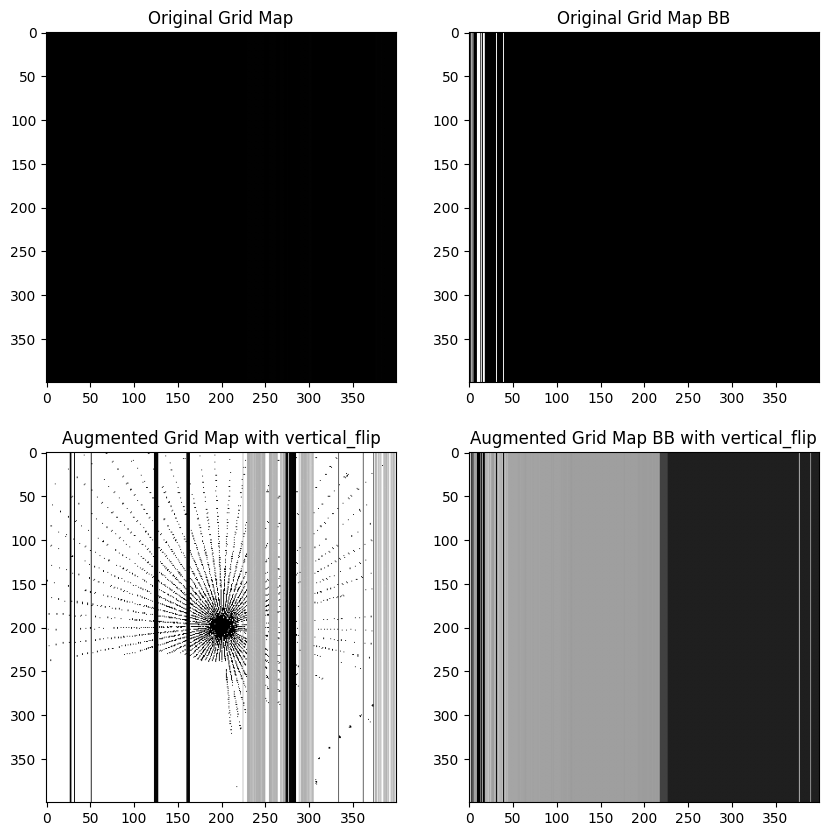

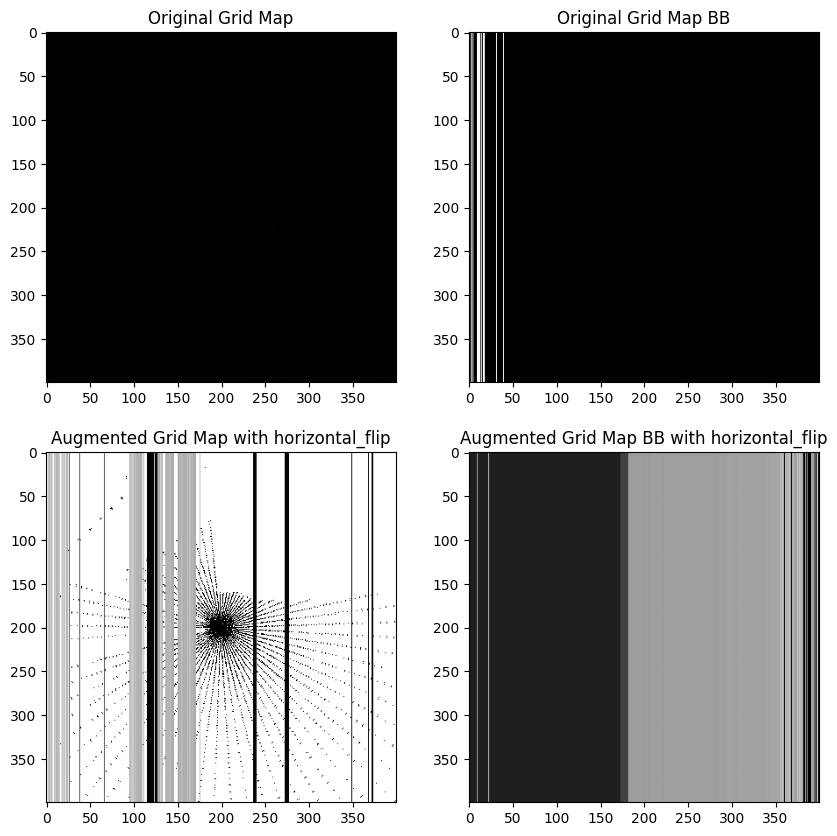

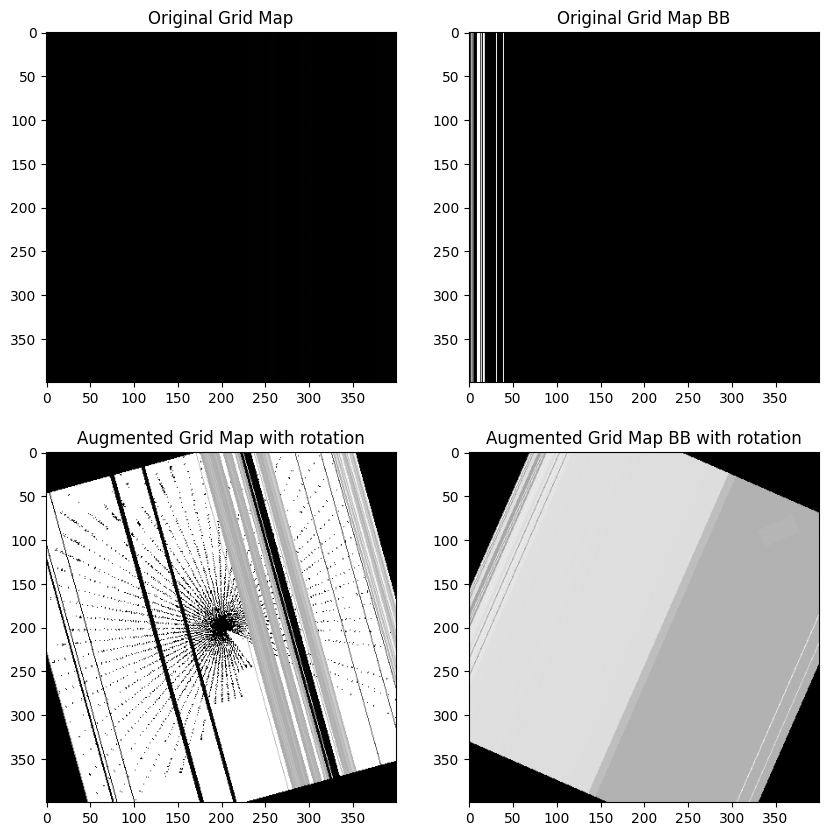

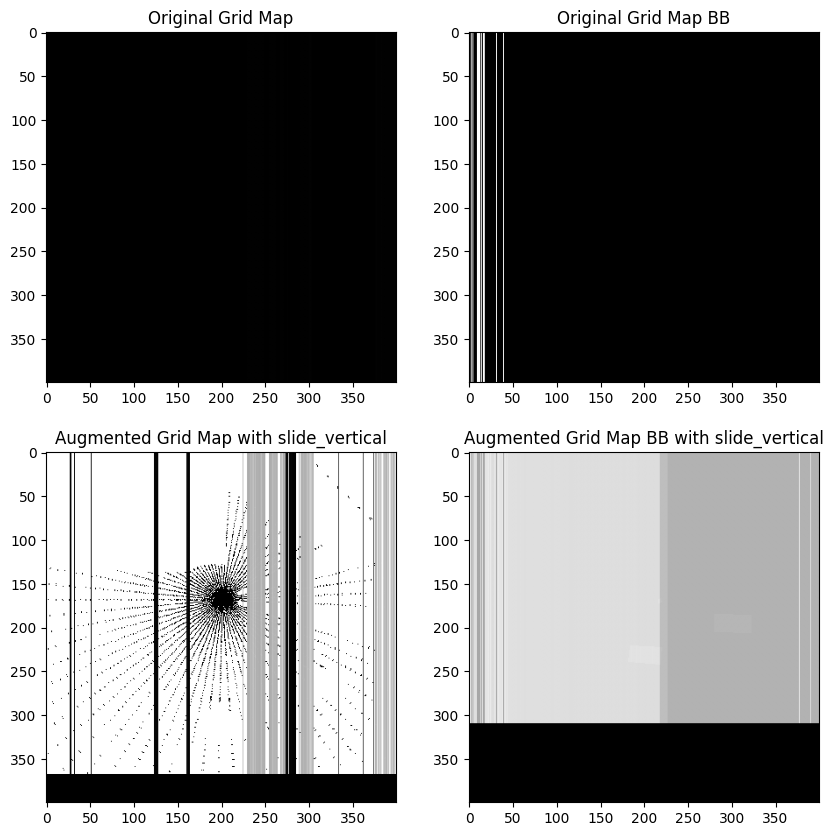

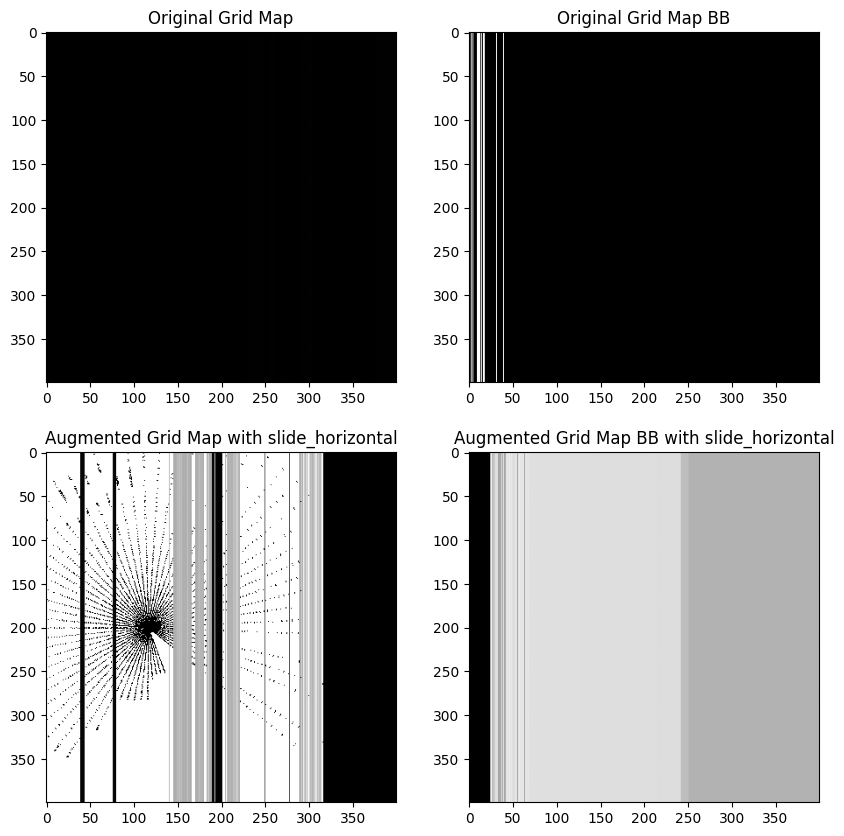

...

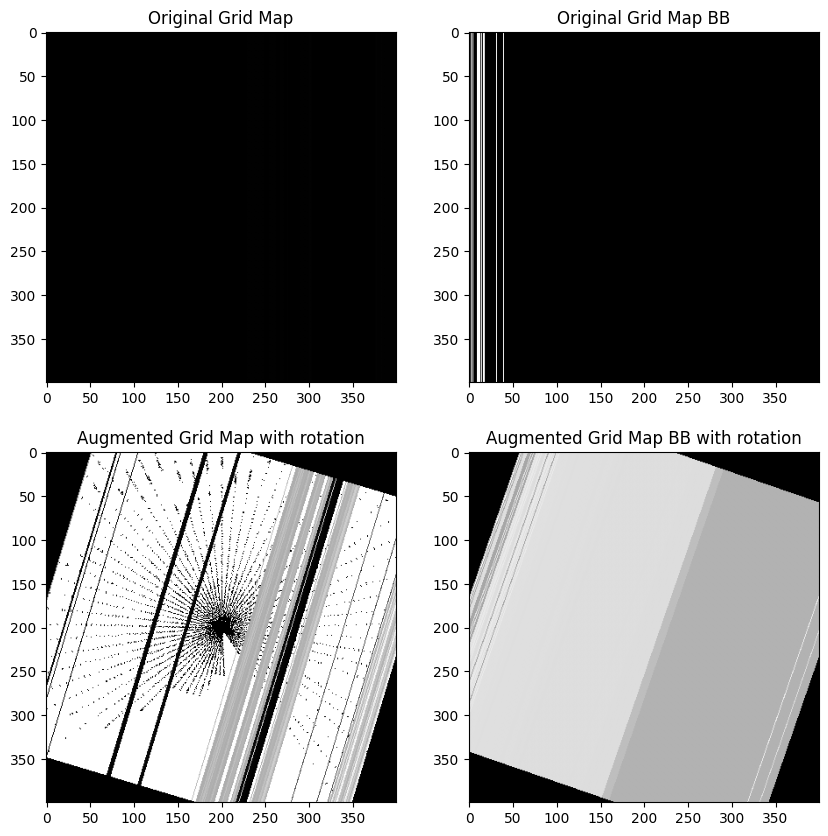

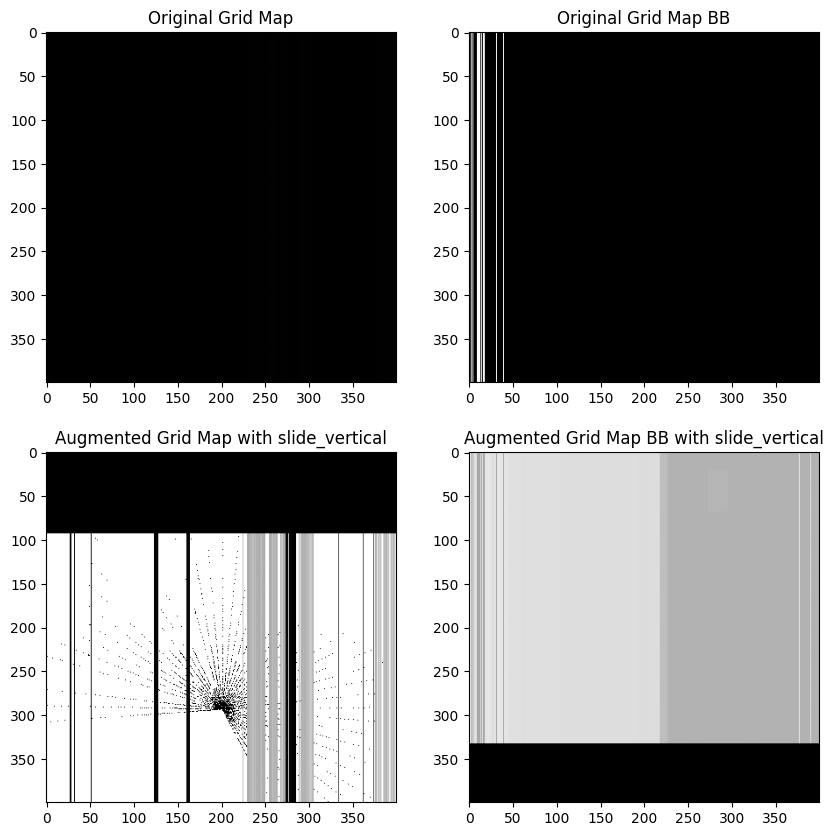

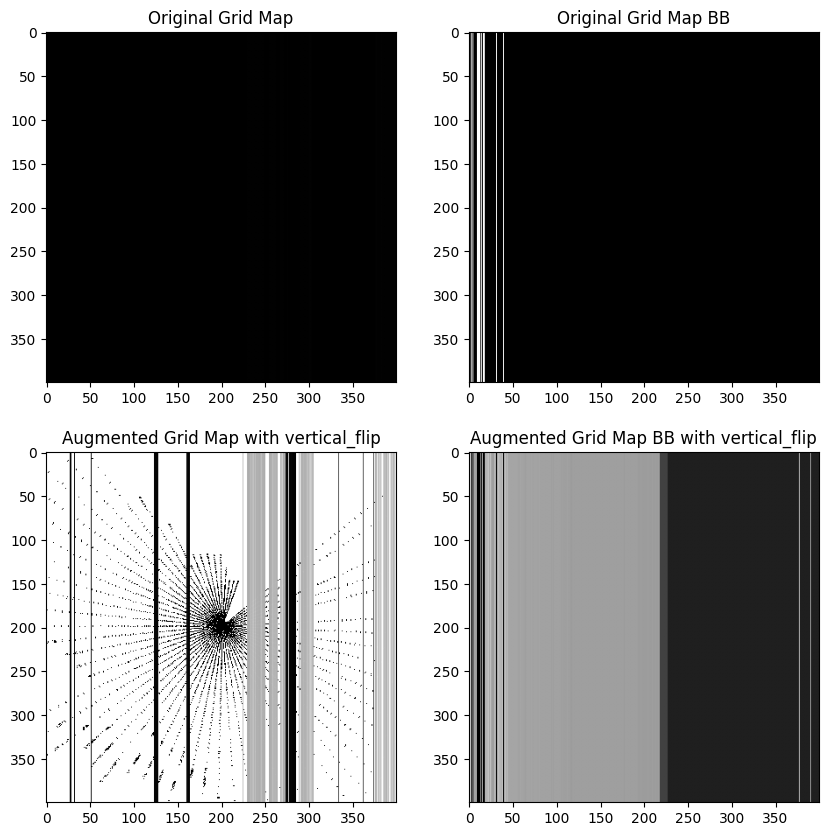

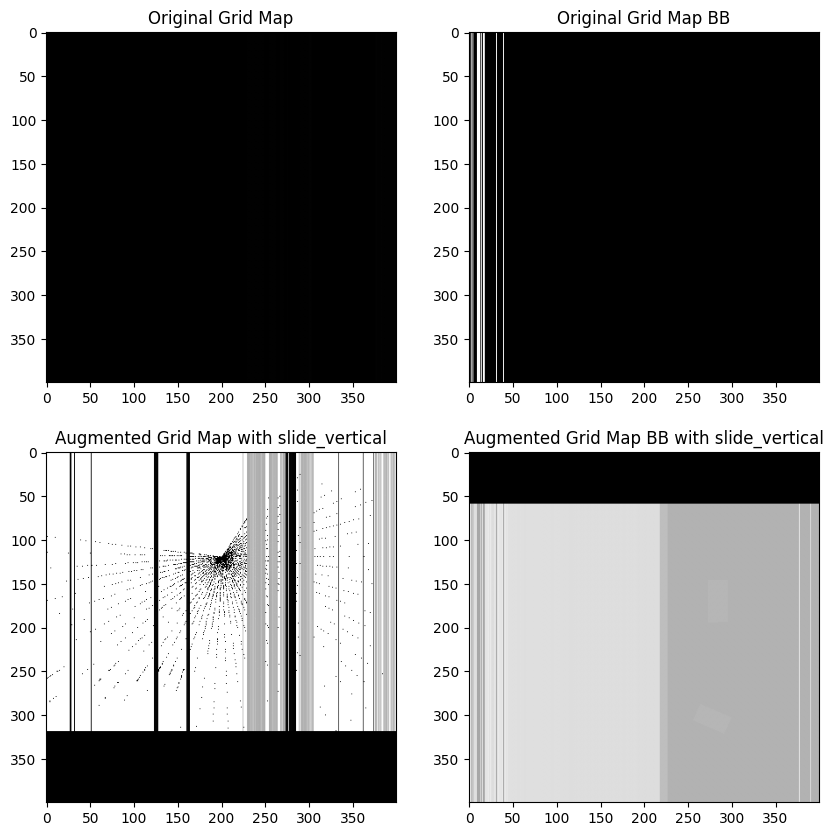

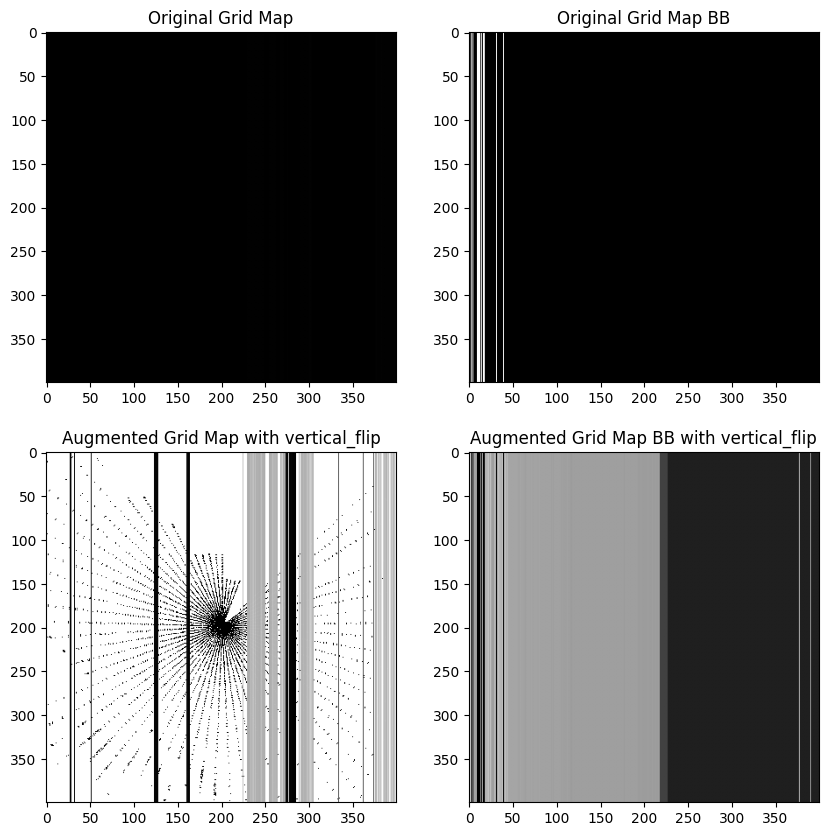

KeyboardInterrupt: 

In [17]:
# Apply augmentation
augmented_grid_maps, augmented_grid_maps_BB, augmentations = apply_augmentation(complete_grid_maps[0:100], complete_grid_maps_BB[0:100])

# Visualize the original and augmented grid maps
for i in range(complete_grid_maps.shape[0]):
    fig, ax = plt.subplots(2, 2, figsize=(10, 10))
    
    ax[0, 0].imshow(complete_grid_maps[i], cmap='gray')
    ax[0, 0].set_title('Original Grid Map')
    
    ax[0, 1].imshow(complete_grid_maps_BB[i], cmap='gray')
    ax[0, 1].set_title('Original Grid Map BB')
    
    ax[1, 0].imshow(augmented_grid_maps[i], cmap='gray')
    ax[1, 0].set_title(f'Augmented Grid Map with {augmentations[i]}')
    
    ax[1, 1].imshow(augmented_grid_maps_BB[i], cmap='gray')
    ax[1, 1].set_title(f'Augmented Grid Map BB with {augmentations[i]}')
    
    plt.show()